In [11]:
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Conv2D, Input, MaxPooling2D, Dropout, concatenate, UpSampling2D, LeakyReLU
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras import backend as K
from tensorflow.keras.activations import sigmoid
from tensorflow.keras.regularizers import l2
    
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.models import *
from tensorflow.keras.preprocessing.image import *
from tensorflow.keras.callbacks import *

import gc
import numpy as np
import matplotlib.pyplot as plt

In [2]:
gpu_options = tf.compat.v1.GPUOptions(allow_growth=True)
session = tf.compat.v1.InteractiveSession(config=tf.compat.v1.ConfigProto(gpu_options=gpu_options))

In [3]:
print(tf.test.is_built_with_cuda())
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)

True
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
import glob

h = 256
w = 256

#train = 900 #sorted(glob.glob("/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/train-1/120322323/*"))[:1000]
#train_mask = 900 #sorted(glob.glob("/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/mask-1/120322323/*"))[:1000]

#print(f'Total Train Images : {train}\nTotal Mask Image : {train_mask}')

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.transform import resize
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.notebook import tqdm
import os
from PIL import UnidentifiedImageError

# Define paths
preprocessed_dir = '/content/drive/MyDrive/Microsoft-Building-Dataset/preprocessed/122101000_2'
os.makedirs(preprocessed_dir, exist_ok=True)

# Desired height and width for resizing
h, w = 256, 256  # Adjust based on your requirements

# Define a function for processing a single image
def process_image(idx, img_path, mask_path, h, w):
    try:
        # Load and preprocess image
        img = load_img(img_path)
        x_img = img_to_array(img)
        x_img = resize(x_img, (h, w, 3), mode='constant', preserve_range=True)

        # Load and preprocess mask
        mask = img_to_array(load_img(mask_path, color_mode="grayscale"))
        mask = resize(mask, (h, w, 1), mode='constant', preserve_range=True)

        return idx, x_img / 255.0, mask / 255.0
    except UnidentifiedImageError as e:
        print(f"Skipping file at index {idx} due to error: {e}")
        return idx, None, None
    except Exception as e:
        print(f"An unexpected error occurred at index {idx}: {e}")
        return idx, None, None

# Use ThreadPoolExecutor for parallel processing
with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust the number of workers based on your CPU
    futures = [executor.submit(process_image, idx, img, mimg, h, w) for idx, (img, mimg) in enumerate(zip(train, train_mask))]

    for future in tqdm(as_completed(futures), total=len(futures)):
        idx, x_img, mask = future.result()
        if x_img is not None and mask is not None:
            np.save(os.path.join(preprocessed_dir, f'X_{idx}.npy'), x_img)
            np.save(os.path.join(preprocessed_dir, f'y_{idx}.npy'), mask)

print("Preprocessing and saving complete.")

In [ ]:
from concurrent.futures import ThreadPoolExecutor, as_completed
import numpy as np
import os
from tqdm.notebook import tqdm

preprocessed_dir = '/kaggle/input/preprocessed-satellite-images-masks/122101000last(hope)/122101000last(hope)'

# Initialize arrays
h, w = 256, 256  # Adjust based on your requirements
X = np.zeros((train, h, w, 3), dtype=np.float32)
y = np.zeros((train, h, w, 1), dtype=np.float32)

# Define a function to load a single preprocessed image and mask
def load_image_mask(idx, preprocessed_dir):
    try:
        x_img = np.load(os.path.join(preprocessed_dir, f'X_{idx}.npy'))
        mask = np.load(os.path.join(preprocessed_dir, f'y_{idx}.npy'))
        return idx, x_img, mask
    except FileNotFoundError as e:
        print(f"Skipping file at index {idx} due to error: {e}")
        return idx, None, None
    except Exception as e:
        print(f"An unexpected error occurred at index {idx}: {e}")
        return idx, None, None

# Use ThreadPoolExecutor for parallel loading
with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust the number of workers based on your CPU
    futures = [executor.submit(load_image_mask, idx, preprocessed_dir) for idx in range(train)]

    for future in tqdm(as_completed(futures), total=len(futures)):
        idx, x_img, mask = future.result()
        if x_img is not None and mask is not None:
            X[idx] = x_img
            y[idx] = mask

print("Data loading complete.")


In [5]:
from concurrent.futures import ThreadPoolExecutor, as_completed
import numpy as np
import os
from tqdm.notebook import tqdm

# Directories containing preprocessed images and masks
preprocessed_dirs = [
    '/kaggle/input/preprocessed-satellite-images-masks/Preprocessed3-1/122101000_1',
    '/kaggle/input/preprocessed-satellite-images-masks/Preprocessed3-2/122101000_2'
]

# Limit the number of images to load from each directory
max_images_per_dir = 2000

# Get the number of images in each directory, capped at 2000
num_images_dir1 = min(len([f for f in os.listdir(preprocessed_dirs[0]) if f.startswith('X_')]), max_images_per_dir)
num_images_dir2 = min(len([f for f in os.listdir(preprocessed_dirs[1]) if f.startswith('X_')]), max_images_per_dir)
total_images = num_images_dir1 + num_images_dir2

# Initialize arrays
h, w = 256, 256  # Adjust based on your requirements
X = np.zeros((total_images, h, w, 3), dtype=np.float32)
y = np.zeros((total_images, h, w, 1), dtype=np.float32)

# Define a function to load a single preprocessed image and mask
def load_image_mask(global_idx):
    if global_idx < num_images_dir1:
        directory = preprocessed_dirs[0]
        local_idx = global_idx
    else:
        directory = preprocessed_dirs[1]
        local_idx = global_idx - num_images_dir1

    try:
        x_img = np.load(os.path.join(directory, f'X_{local_idx}.npy'))
        mask = np.load(os.path.join(directory, f'y_{local_idx}.npy'))
        return global_idx, x_img, mask
    except FileNotFoundError as e:
        print(f"Skipping file at index {global_idx} due to error: {e}")
        return global_idx, None, None
    except Exception as e:
        print(f"An unexpected error occurred at index {global_idx}: {e}")
        return global_idx, None, None

# Use ThreadPoolExecutor for parallel loading
with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust the number of workers based on your CPU
    futures = [executor.submit(load_image_mask, idx) for idx in range(total_images)]

    for future in tqdm(as_completed(futures), total=len(futures)):
        idx, x_img, mask = future.result()
        if x_img is not None and mask is not None:
            X[idx] = x_img
            y[idx] = mask

print("Data loading complete.")

  0%|          | 0/4000 [00:00<?, ?it/s]

Skipping file at index 3767 due to error: [Errno 2] No such file or directory: '/kaggle/input/preprocessed-satellite-images-masks/Preprocessed3-2/122101000_2/X_1767.npy'
Data loading complete.


In [6]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
gc.collect()

(3400, 256, 256, 3) (3400, 256, 256, 1) (600, 256, 256, 3) (600, 256, 256, 1)


1042

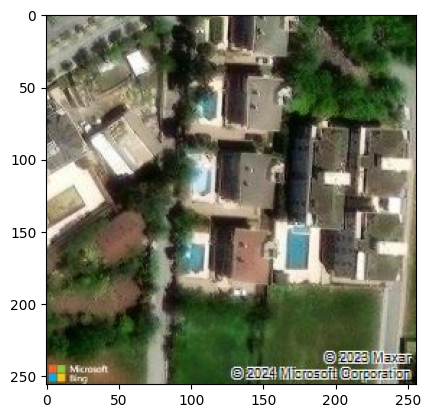

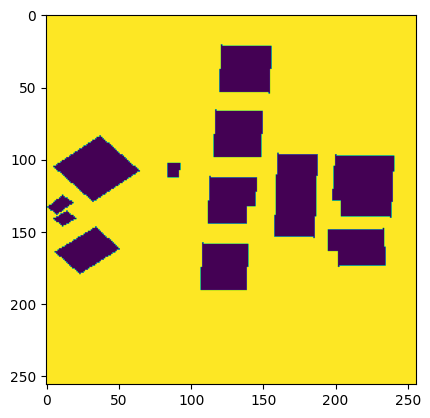

In [7]:
plt.imshow(X[3003])
plt.show()
plt.imshow(y[3003])
plt.show()

## **U-NET Default**

In [10]:
def conv_block(inputs = None, filters = 32, dropout_prob = 0, max_pooling = True):
    X = inputs
    #Setting kernel size = 3, padding = same, and kernel initializer as he_normal
    layer = Conv2D(filters = filters, 
                        kernel_size = 3, 
                        kernel_initializer = 'he_normal',
                        padding = 'same')(X)
    layer = BatchNormalization(axis = 3)(layer, training = True)
    layer = ReLU()(layer)
    layer = Conv2D(filters = filters, 
                        kernel_size = 3, 
                        kernel_initializer = 'he_normal',
                        padding = 'same')(layer)
    layer = BatchNormalization(axis = 3)(layer, training = True)
    layer = ReLU()(layer)
    
    if dropout_prob > 0:
        layer = Dropout(dropout_prob)(layer)
    if max_pooling:
        next_layer = MaxPooling2D(2, strides = 2)(layer)
    else:
        next_layer = layer
        
    skip_connection = layer
    return next_layer, skip_connection

def upsampling_block(expansive_input, contractive_input, filters):
    layer = Conv2DTranspose(filters = filters, 
                            kernel_size = 3, 
                            strides = (2,2), 
                            padding = 'same')(expansive_input)
    layer = concatenate([layer, contractive_input], axis=3)
    conv = Conv2D(filters, # Number of filters
                  3,# Kernel size   
                  padding='same',
                  kernel_initializer= 'he_normal')(layer)
    conv = BatchNormalization(axis=3)(layer,training=True)
    conv = ReLU()(layer)
    conv = Conv2D(filters, # Number of filters
                  3,# Kernel size   
                  padding='same',
                  kernel_initializer= 'he_normal')(conv)
    conv = BatchNormalization(axis=3)(conv,training=True)
    conv = ReLU()(conv)

    return conv

def unet_model(input_size = (192, 256, 3), filters = 32, classes = 1):
    inputs = Input(input_size)
    
    cblock1, sc1 = conv_block(inputs, filters)
    filters = filters * 2 
    
    cblock2, sc2 = conv_block(cblock1, filters)
    filters = filters * 2
    
    cblock3, sc3 = conv_block(cblock2, filters)
    filters = filters * 2

    cblock4, sc4 = conv_block(cblock3, filters, dropout_prob = 0.3)
    filters = filters * 2
    
    cblock5, sc5 = conv_block(cblock4, filters, dropout_prob = 0.3, max_pooling = False)
    filters = filters/2
    
    ublock6 = upsampling_block(cblock5, sc4, filters)
    filters = filters/2
    
    ublock7 = upsampling_block(ublock6, sc3, filters)
    filters = filters/2
    
    ublock8 = upsampling_block(ublock7, sc2, filters)
    filters = filters/2
    
    ublock9 = upsampling_block(ublock8, sc1, filters)
    
    layer = Conv2D(filters, 
                   kernel_size = 3, 
                   padding = 'same',
                   kernel_initializer = 'he_normal')(ublock9)
    layer = BatchNormalization(axis=3)(layer,training=True)
    layer = ReLU()(layer)
    layer = Conv2D(filters = classes,
                    kernel_size = 1,
                    padding = 'same')(layer)
    layer = BatchNormalization(axis=3)(layer,training=True)
    layer = ReLU()(layer)

    model = Model(inputs = inputs, outputs = layer)
    return model

print("Model initialized.")

Model initialized.


## **U-NET Regularization**

In [12]:
#U-NET with regularization

# Initialize U-Net model with regularization
def conv_block(inputs, filters=32, dropout_prob=0, max_pooling=True, l2_lambda=0.001):
    X = inputs
    layer = Conv2D(filters=filters, kernel_size=3, kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(l2_lambda))(X)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)
    layer = Conv2D(filters=filters, kernel_size=3, kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(l2_lambda))(layer)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)

    if dropout_prob > 0:
        layer = Dropout(dropout_prob)(layer)
    if max_pooling:
        next_layer = MaxPooling2D(2, strides=2)(layer)
    else:
        next_layer = layer

    skip_connection = layer
    return next_layer, skip_connection

def upsampling_block(expansive_input, contractive_input, filters, l2_lambda=0.001):
    layer = Conv2DTranspose(filters=filters, kernel_size=3, strides=(2, 2), padding='same')(expansive_input)
    layer = concatenate([layer, contractive_input], axis=3)
    layer = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_lambda))(layer)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)
    layer = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_lambda))(layer)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)

    return layer

def unet_model(input_size=(256, 256, 3), filters=32, classes=1, l2_lambda=0.001):
    inputs = Input(input_size)

    cblock1, sc1 = conv_block(inputs, filters, l2_lambda=l2_lambda)
    filters *= 2

    cblock2, sc2 = conv_block(cblock1, filters, l2_lambda=l2_lambda)
    filters *= 2

    cblock3, sc3 = conv_block(cblock2, filters, l2_lambda=l2_lambda)
    filters *= 2

    cblock4, sc4 = conv_block(cblock3, filters, dropout_prob=0.3, l2_lambda=l2_lambda)
    filters *= 2

    cblock5, sc5 = conv_block(cblock4, filters, dropout_prob=0.3, max_pooling=False, l2_lambda=l2_lambda)
    filters //= 2

    ublock6 = upsampling_block(cblock5, sc4, filters, l2_lambda=l2_lambda)
    filters //= 2

    ublock7 = upsampling_block(ublock6, sc3, filters, l2_lambda=l2_lambda)
    filters //= 2

    ublock8 = upsampling_block(ublock7, sc2, filters, l2_lambda=l2_lambda)
    filters //= 2

    ublock9 = upsampling_block(ublock8, sc1, filters, l2_lambda=l2_lambda)

    layer = Conv2D(filters, kernel_size=3, padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_lambda))(ublock9)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)
    layer = Conv2D(filters=classes, kernel_size=1, padding='same')(layer)
    layer = BatchNormalization(axis=3)(layer, training=True)
    layer = ReLU()(layer)

    model = Model(inputs=inputs, outputs=layer)
    return model

print("Model initialized with regularization.")

Model initialized with regularization.


In [13]:
img_height = 256
img_width = 256
num_channels = 3

unet = unet_model((img_height, img_width, num_channels))

In [ ]:
unet.summary()

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(unet, show_shapes=True, show_layer_names=True)

In [21]:
model_load_path = "/kaggle/working/unet_54_epoch_all_urban.h5"
unet = load_model(model_load_path)

print(f"Model {model_load_path} is loaded.")

Model /kaggle/working/unet_54_epoch_all_urban.h5 is loaded.


In [14]:
unet.compile(optimizer = tf.keras.optimizers.Adam(), 
             loss = tf.keras.losses.BinaryCrossentropy(from_logits = True), 
             metrics = ['accuracy'])
print("Compiled.")

Compiled.


In [15]:
lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', 
                                                 factor=0.1,
                                                 patience=10,
                                                 min_lr=1e-6)# orj 6
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                patience=10,
                                                min_delta=0.001,#orj 001
                                                restore_best_weights=True)
EPOCHS = 70
initEPOCHS = 0

print(f"Epochs initialized as start with {initEPOCHS} and it will be trained for {EPOCHS} epochs.")

Epochs initialized as start with 0 and it will be trained for 70 epochs.


In [16]:
# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator to your data
datagen.fit(X_train)

In [17]:
import tensorflow as tf

tf.config.optimizer.set_experimental_options({
    'layout_optimizer': False
})

print ("layout_optimizer set to disable")

layout_optimizer set to disable


In [18]:
modelhist = unet.fit(X_train, y_train, epochs= initEPOCHS + EPOCHS, initial_epoch=initEPOCHS , validation_data=(X_test, y_test), callbacks=[lr,es])

Epoch 1/70


I0000 00:00:1720009260.110864     127 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


107/107 [==============================] - 101s 665ms/step - loss: 1.7435 - accuracy: 0.4804 - val_loss: 0.6769 - val_accuracy: 0.4750 - lr: 0.0010
Epoch 2/70
107/107 [==============================] - 60s 562ms/step - loss: 0.5947 - accuracy: 0.5367 - val_loss: 0.5461 - val_accuracy: 0.5482 - lr: 0.0010
Epoch 3/70
107/107 [==============================] - 60s 562ms/step - loss: 0.5229 - accuracy: 0.5652 - val_loss: 0.5066 - val_accuracy: 0.5517 - lr: 0.0010
Epoch 4/70
107/107 [==============================] - 60s 562ms/step - loss: 0.4946 - accuracy: 0.5874 - val_loss: 0.4877 - val_accuracy: 0.5871 - lr: 0.0010
Epoch 5/70
107/107 [==============================] - 60s 562ms/step - loss: 0.4762 - accuracy: 0.6041 - val_loss: 0.4671 - val_accuracy: 0.6089 - lr: 0.0010
Epoch 6/70
107/107 [==============================] - 60s 562ms/step - loss: 0.4709 - accuracy: 0.6174 - val_loss: 0.4688 - val_accuracy: 0.5904 - lr: 0.0010
Epoch 7/70
107/107 [==============================] - 60s 562m

In [19]:
model_save_path = "/kaggle/working/unet_reg_70_epoch_all_urban.h5"
unet.save(model_save_path)
print(f"Model saved to {model_save_path}")

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved to /kaggle/working/unet_reg_70_epoch_all_urban.h5


In [20]:
model_load_path = "/kaggle/working/unet_reg_70_epoch_all_urban.h5"
unet = load_model(model_load_path)
print(f"Model {model_load_path} is loaded.")

Model /kaggle/working/unet_reg_70_epoch_all_urban.h5 is loaded.


In [21]:
y_pred = unet.predict(X_test)

19/19 [==============================] - 4s 168ms/step


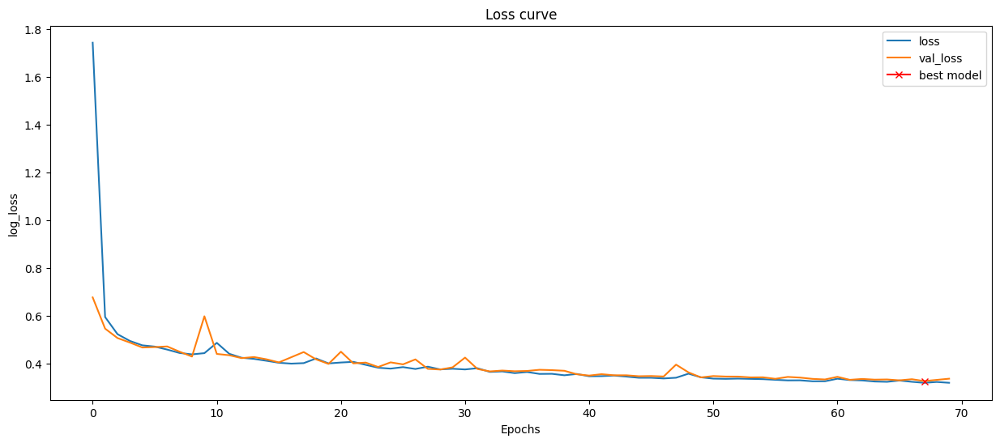

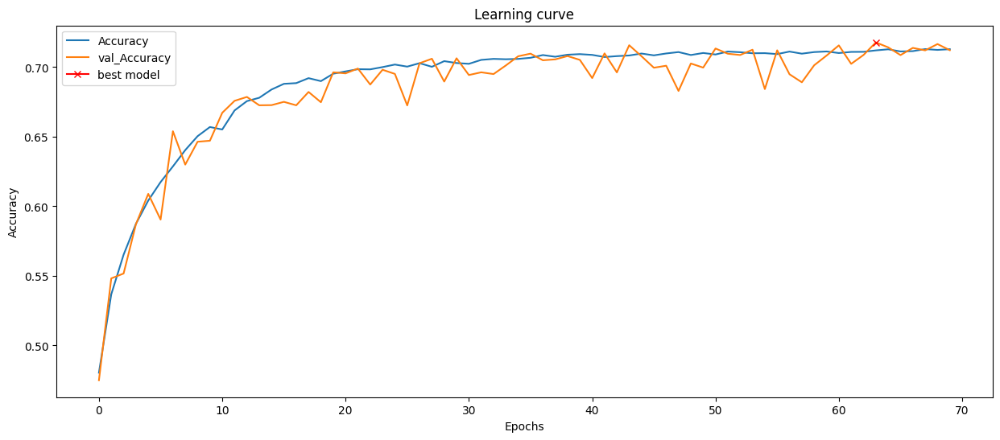

In [22]:
plt.figure(figsize = (15,6))
plt.title("Loss curve")
plt.plot(modelhist.history["loss"], label="loss")
plt.plot(modelhist.history["val_loss"], label="val_loss")
plt.plot(np.argmin(modelhist.history["val_loss"]), np.min(modelhist.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

plt.figure(figsize = (15,6))
plt.title("Learning curve")
plt.plot(modelhist.history["accuracy"], label="Accuracy")
plt.plot(modelhist.history["val_accuracy"], label="val_Accuracy")
plt.plot(np.argmax(modelhist.history["val_accuracy"]), np.max(modelhist.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend();

bunu nasıl hızlandırcaz
??????

In [ ]:
for i in range(len(y_pred)):
    for j in range(len(y_pred[i])):
        for k in range(len(y_pred[i][j])):
            y_pred[i][j][k][0] = np.floor(y_pred[i][j][k][0])

print("Predictions array initialized")

In [23]:
def showimg(X_test, y_test, y_pred, ind):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axs[0].imshow(X_test[ind])
    axs[0].set_title('Original Image')
    axs[0].axis('off')
    
    # Ground truth mask
    axs[1].imshow(y_test[ind])
    axs[1].set_title('Ground Truth Mask')
    axs[1].axis('off')
    
    # Predicted mask
    axs[2].imshow(y_pred[ind])
    axs[2].set_title('Predicted Mask')
    axs[2].axis('off')
    
    plt.show()

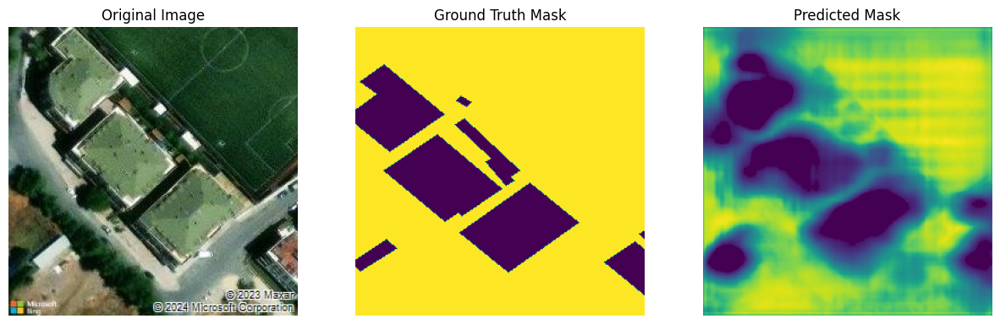

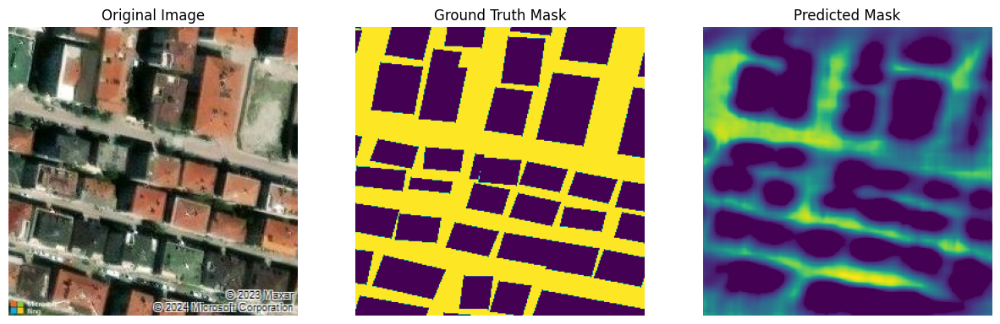

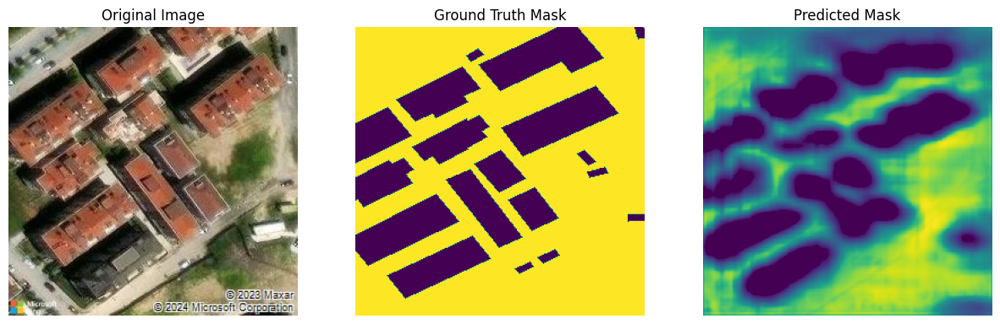

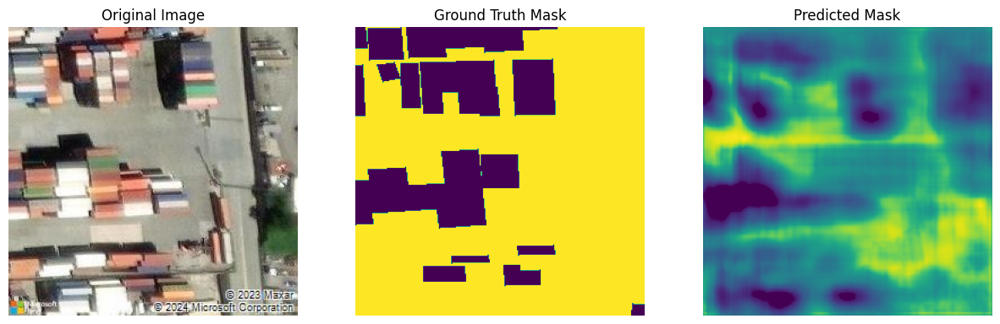

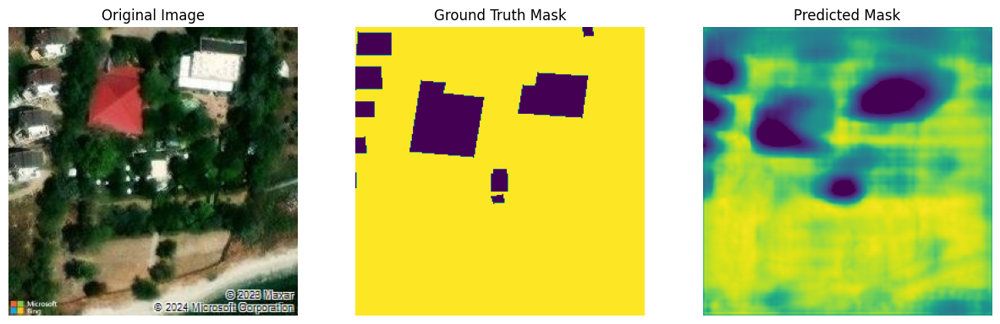

In [25]:
showimg(X_test, y_test, y_pred, 13)
showimg(X_test, y_test, y_pred, 23)
showimg(X_test, y_test, y_pred, 43)
showimg(X_test, y_test, y_pred, 33)
showimg(X_test, y_test, y_pred, 53)

In [22]:
import numpy as np
import cv2
from skimage import measure
import matplotlib.pyplot as plt

# Assuming y_pred is already thresholded (0 or 1)
y_pred_thresholded = np.floor(y_pred).astype(np.uint8)

def find_centroids(binary_image, min_area=100):
    # Label connected components
    labels = measure.label(binary_image)
    
    # Calculate properties of labeled regions
    properties = measure.regionprops(labels)
    
    # Extract centroids, filter out small and non-black regions
    centroids = [prop.centroid for prop in properties if prop.area >= min_area and np.all(binary_image[labels == prop.label] == 1)]
    return centroids

def showimg_with_centroids(X_test, y_test, y_pred, ind, min_area=100):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Original image
    axs[0].imshow(X_test[ind])
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Ground truth mask
    axs[1].imshow(y_test[ind].squeeze(), cmap='gray')
    axs[1].set_title('Ground Truth Mask')
    axs[1].axis('off')

    # Predicted mask with centroids
    pred_image = y_pred[ind].squeeze()
    axs[2].imshow(pred_image, cmap='gray')
    centroids = find_centroids(pred_image, min_area)
    
    for i, centroid in enumerate(centroids):
        axs[2].plot(centroid[1], centroid[0], 'r.')
        axs[2].text(centroid[1], centroid[0], str(i+1), color='white', fontsize=12, ha='center', va='center')
        print(f"Building {i+1}: (x, y) = ({centroid[1]:.2f}, {centroid[0]:.2f})")
    
    axs[2].set_title('Predicted Mask with Centroids')
    axs[2].axis('off')

    plt.show()

    return centroids

Building 1: (x, y) = (17.86, 6.20)
Building 2: (x, y) = (37.07, 41.39)
Building 3: (x, y) = (53.95, 109.53)
Building 4: (x, y) = (119.86, 122.93)
Building 5: (x, y) = (231.48, 141.90)
Building 6: (x, y) = (21.04, 146.34)
Building 7: (x, y) = (15.84, 192.31)
Building 8: (x, y) = (121.78, 215.27)
Building 9: (x, y) = (200.67, 241.36)


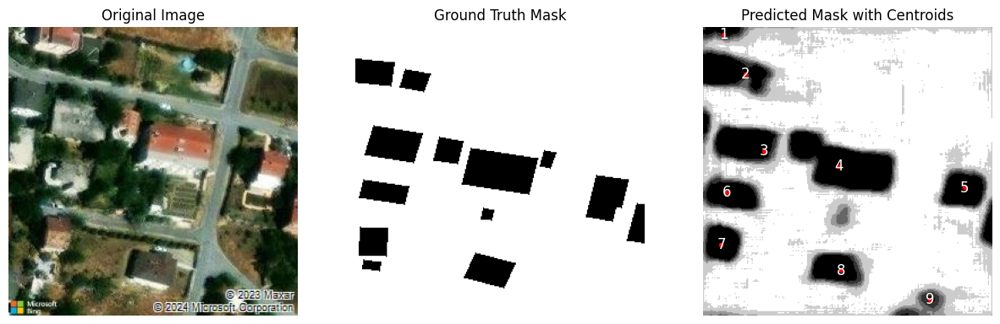

Building 1: (x, y) = (56.06, 25.13)
Building 2: (x, y) = (231.77, 41.03)
Building 3: (x, y) = (16.08, 64.79)
Building 4: (x, y) = (174.82, 74.27)
Building 5: (x, y) = (129.49, 126.26)
Building 6: (x, y) = (14.97, 118.83)
Building 7: (x, y) = (76.24, 177.05)
Building 8: (x, y) = (27.20, 217.49)
Building 9: (x, y) = (81.08, 223.12)
Building 10: (x, y) = (54.21, 235.75)


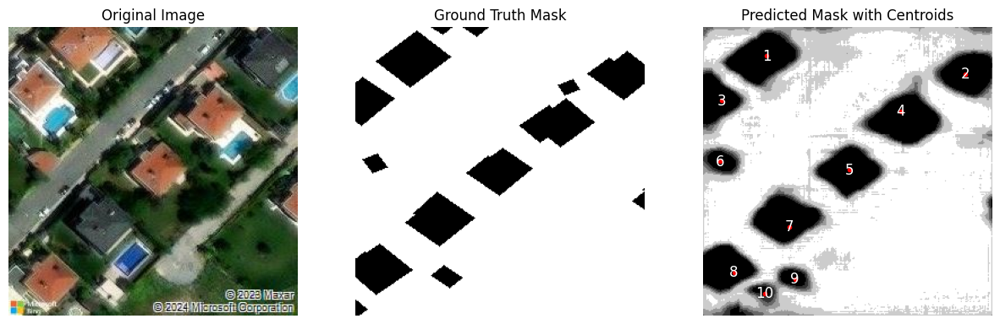

In [23]:
# Show images and find centroids for specific indices
centroids = showimg_with_centroids(X_test, y_test, y_pred_thresholded, 53)
centroids2 = showimg_with_centroids(X_test, y_test, y_pred_thresholded, 33)

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_eval_0.25_75_epoch_urban.h5
19/19 [==============================] - 3s 147ms/step


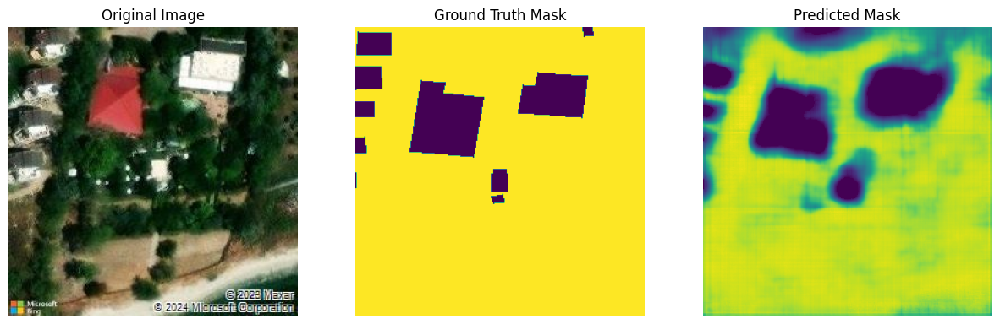

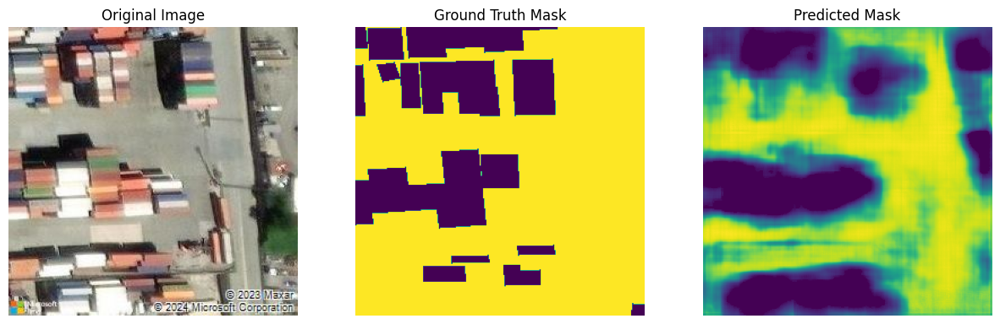

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_eval_0.05_71_epoch_urban.h5
19/19 [==============================] - 3s 147ms/step


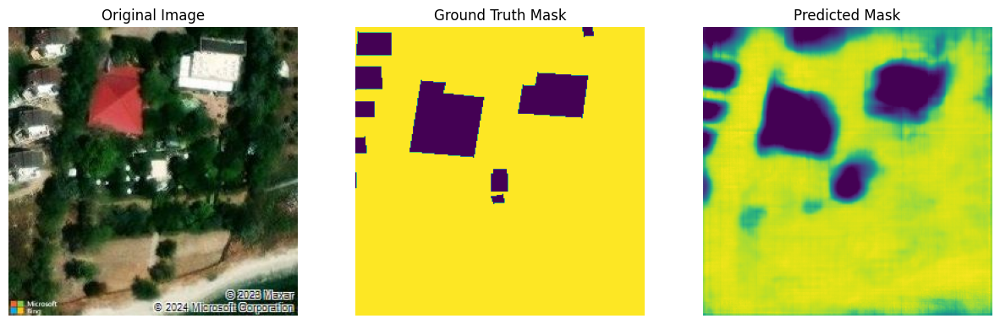

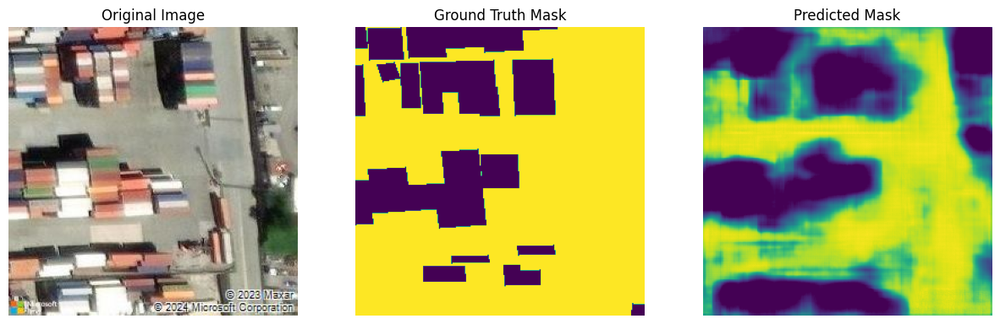

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_eval_0.25_98_epoch_urban.h5
19/19 [==============================] - 3s 146ms/step


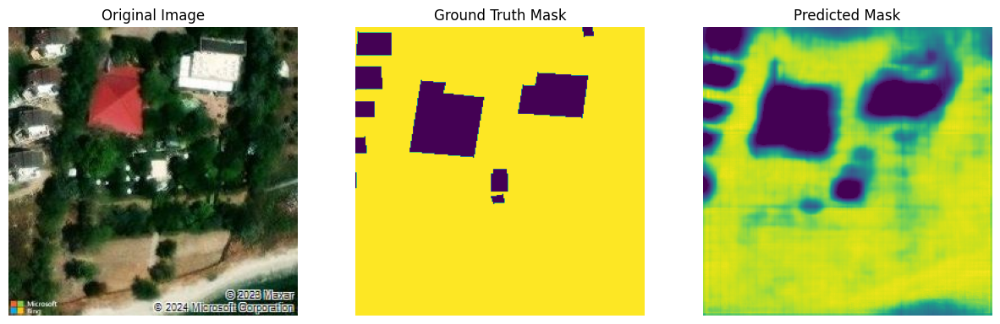

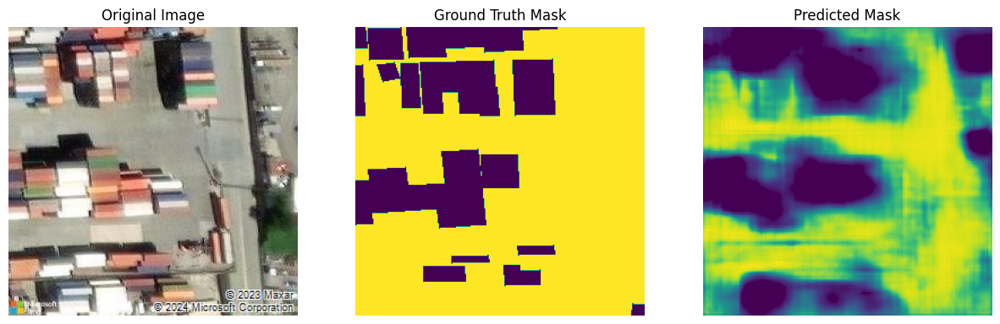

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_50_epoch_urban.h5
19/19 [==============================] - 3s 146ms/step


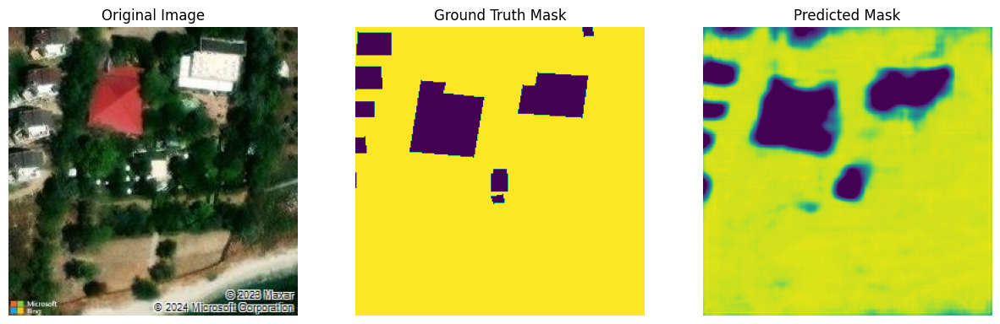

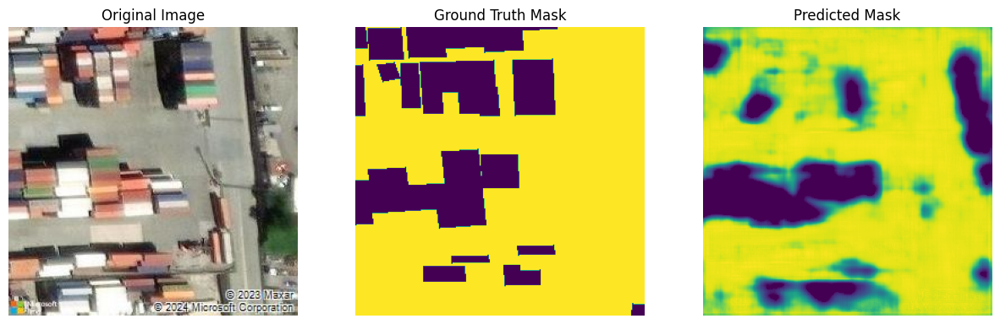

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_65_epoch_urban.h5
19/19 [==============================] - 3s 146ms/step


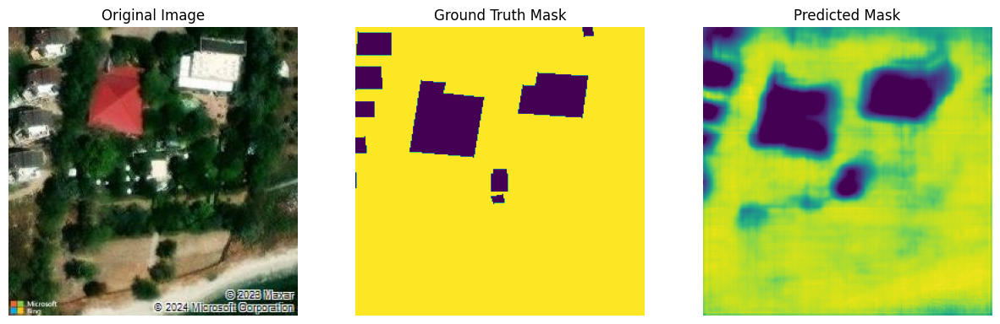

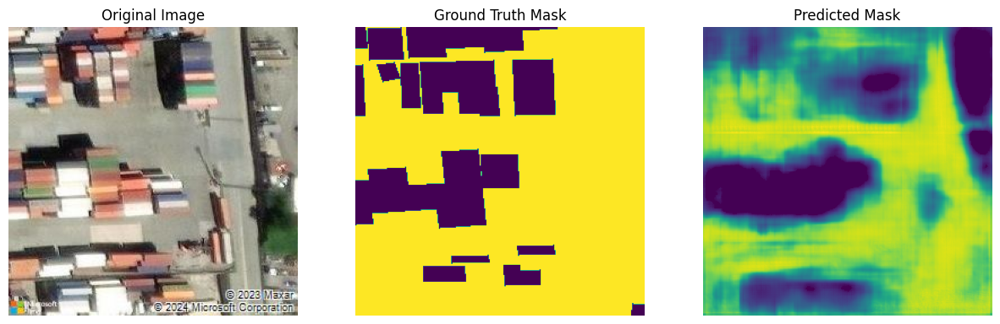

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_67_epoch_rural_to_urban.h5
19/19 [==============================] - 3s 146ms/step


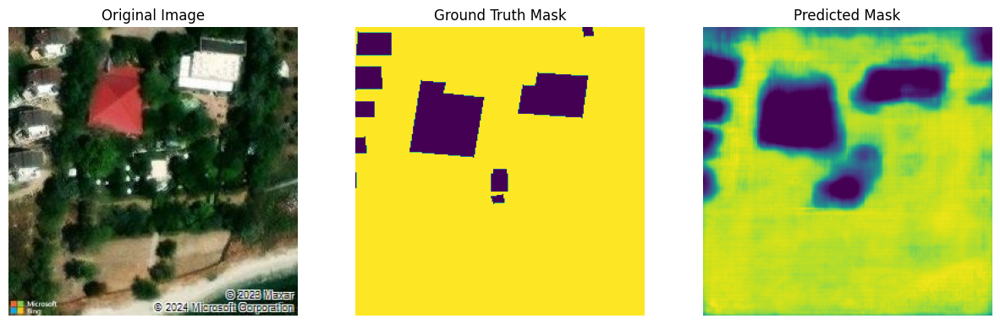

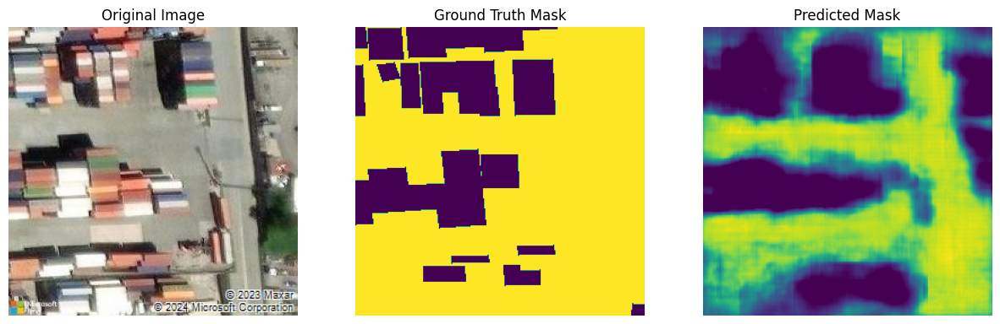

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_77_epoch_urban.h5
19/19 [==============================] - 4s 146ms/step


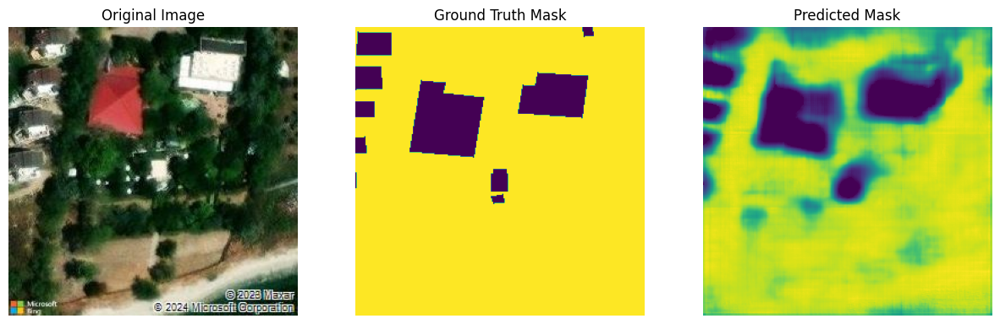

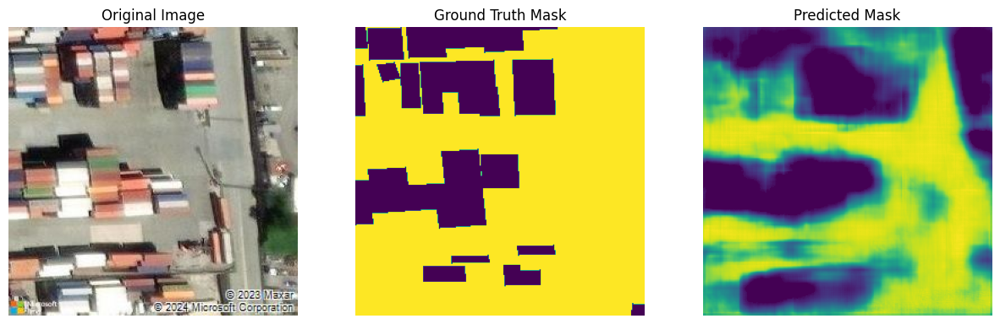

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_50_epoch_rural.h5
19/19 [==============================] - 3s 147ms/step


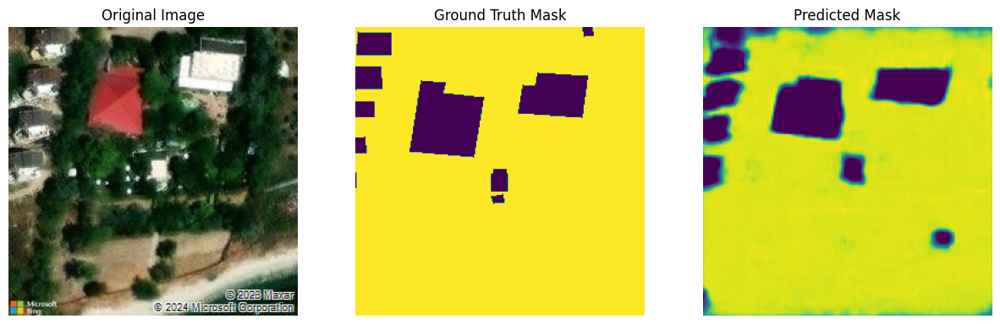

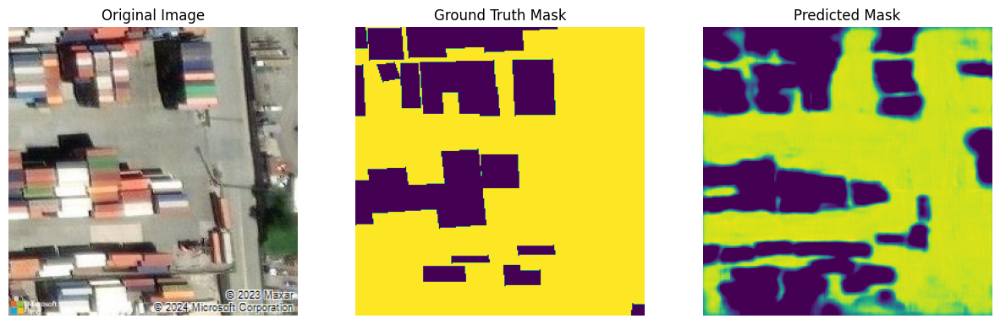

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_100_epoch_urban.h5
19/19 [==============================] - 3s 147ms/step


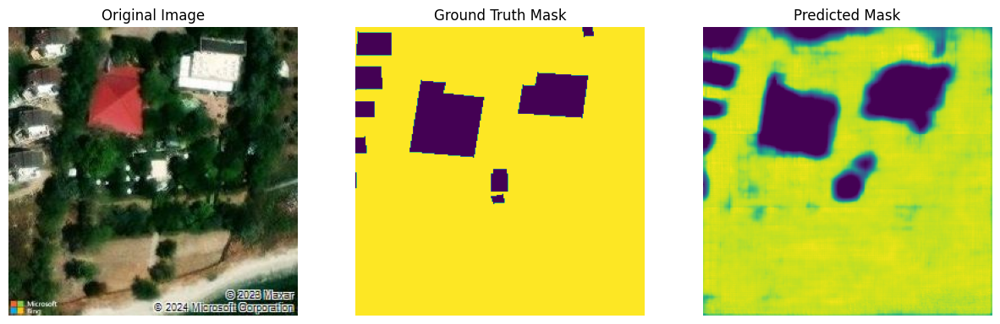

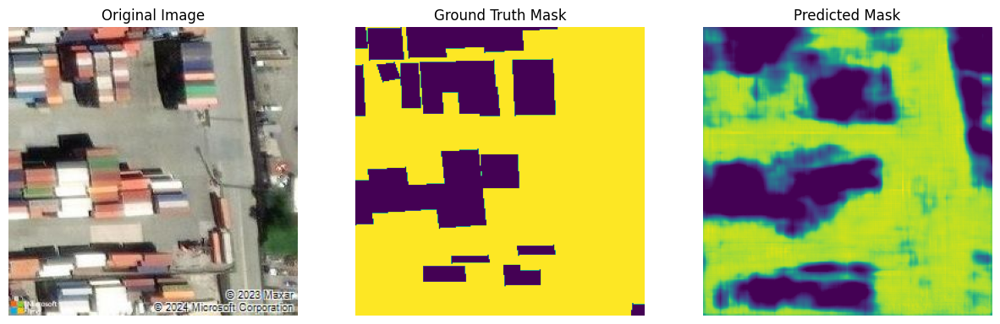

Evaluating model: /kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models/unet_eval_0.05_87_epoch_combined.h5
19/19 [==============================] - 3s 146ms/step


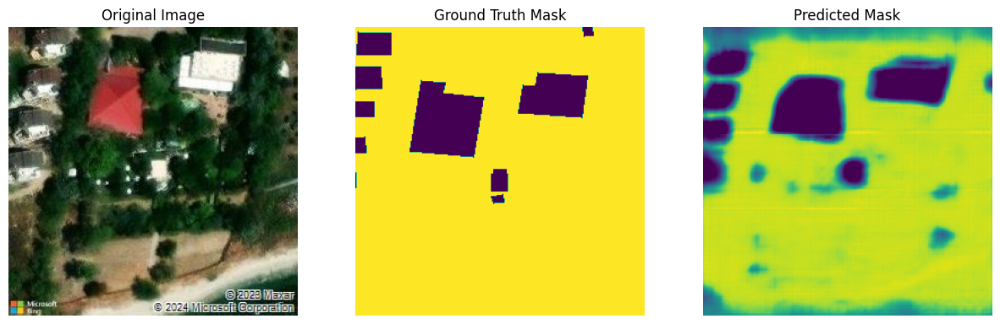

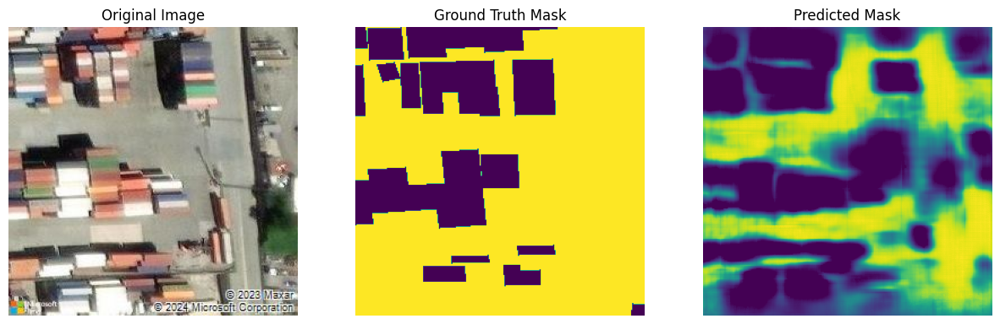

In [28]:
# Directory containing the models
model_directory = "/kaggle/input/sat_img_seg_models/tensorflow2/sat_img_seg_models/1/Sat_Img_Seg_Models"

# List all model files in the directory
model_paths = [os.path.join(model_directory, file) for file in os.listdir(model_directory) if file.endswith('.h5')]

# Load, predict and show results for all models
for model_path in model_paths:
    print(f"Evaluating model: {model_path}")
    model = load_model(model_path)
    y_pred = model.predict(X_test)
    showimg(X_test, y_test, y_pred, 53)
    showimg(X_test, y_test, y_pred, 33)
    #showimg_with_centroids(X_test, y_test, y_pred_thresholded, 53)
    #loss, accuracy = model.evaluate(X_test, y_test)
    #print(f"Model {model_path}: Loss = {loss}, Accuracy = {accuracy}")

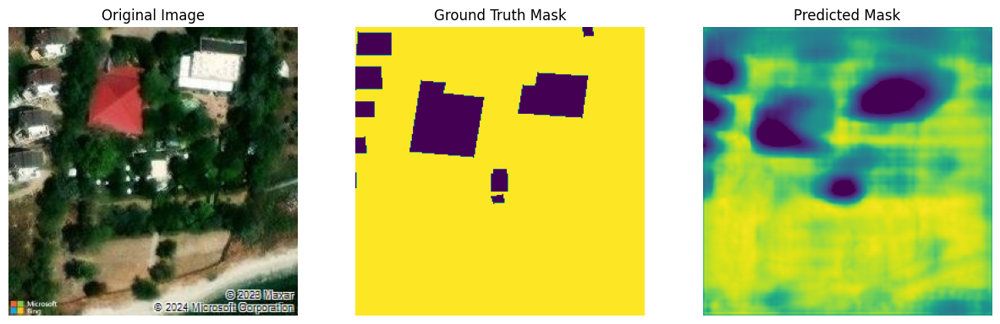

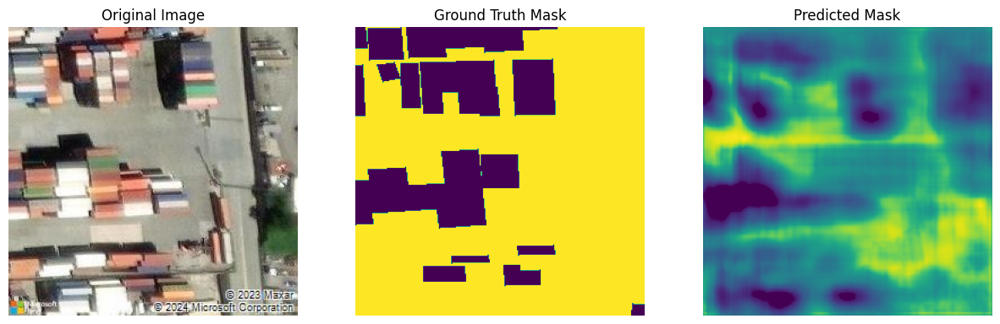

Evaluating model: /kaggle/input/u-net/unet_54_epoch_all_urban.h5
19/19 [==============================] - 3s 146ms/step


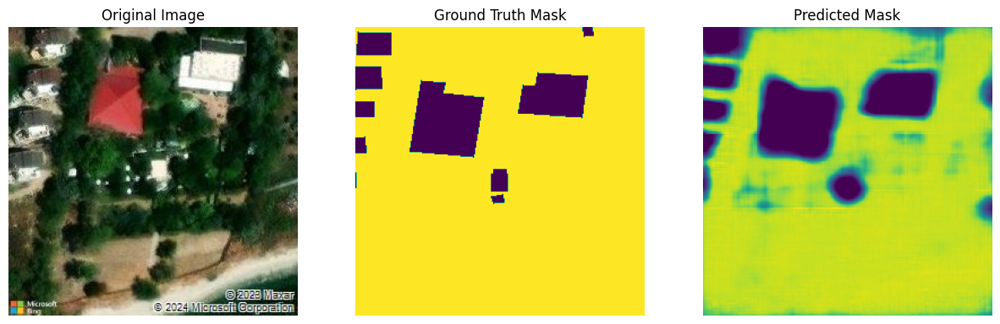

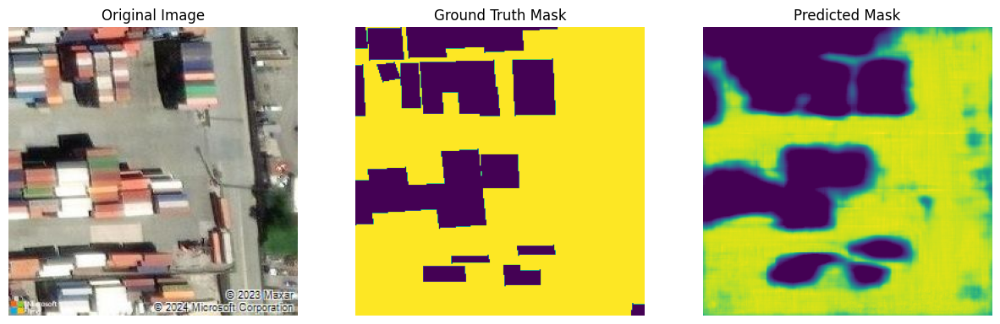

In [27]:
showimg(X_test, y_test, y_pred, 53)
showimg(X_test, y_test, y_pred, 33)
mod_path = "/kaggle/input/u-net/unet_54_epoch_all_urban.h5"
print(f"Evaluating model: {mod_path}")
model = load_model(mod_path)
y_pred = model.predict(X_test)
showimg(X_test, y_test, y_pred, 53)
showimg(X_test, y_test, y_pred, 33)

In [ ]:
#save model
model_names = [
    "unet_100_epoch_urban.h5"
]

# Load, predict and show results for all models
for model_name in model_names:
    print(f"Model saved: {model_name}")
    model_save_path = f"/kaggle/working/{model_name}"
    unet.save(model_save_path)